<a href="https://colab.research.google.com/github/Ibrahim341998/Object_detection_using_yolov5/blob/main/Object_Identification_and_annotation.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# **Real-time Object-annotation using YOLOv5**
##### Implementing Object identification and annotation using yolov5.

In [ ]:
import os 
import glob as glob
import matplotlib.pyplot as plt
import cv2
import requests
import random
import numpy as np

SEED=42
np.random.seed(SEED)

In [ ]:
!ls

sample_data


# **Hyperparameters and constants**
Here we define whether to train the model or not and for how many epochs to train for.
If Train = False,then the last trained model will be used for inference in the notebook if run end to end. 

In [ ]:
TRAIN = True
# Number of epochto train for.
EPOCHS = 25

# **Download and prepare the datasets**
##### we will use the vehicles-OpenImages dataset for training the custom YOLOv5.

In [ ]:
if not os.path.exists('train'):
  !curl -L "https://public.roboflow.com/ds/xKLV14HbTF?key=aJzo7msVta" > roboflow.zip; unzip roboflow.zip; rm roboflow.zip

  dirs = ['train', 'valid', 'test']

  # To remove to every duplicate images from the datasets.
  for i, dir_name in enumerate(dirs):
    all_image_names = sorted(os.listdir(f"{dir_name}/images/"))
    for j, image_name in enumerate(all_image_names):
      if (j % 2) == 0:
        file_name = image_name.split('.jpg')[0]
        os.remove(f"{dir_name}/images/{image_name}")
        os.remove(f"{dir_name}/labels/{file_name}.txt")

  % Total    % Received % Xferd  Average Speed   Time    Time     Time  Current
                                 Dload  Upload   Total   Spent    Left  Speed
100   893  100   893    0     0   3166      0 --:--:-- --:--:-- --:--:--  3166
100 38.4M  100 38.4M    0     0  67.7M      0 --:--:-- --:--:-- --:--:--  366M
Archive:  roboflow.zip
 extracting: README.dataset.txt      
 extracting: README.roboflow.txt     
 extracting: data.yaml               
   creating: test/
   creating: test/images/
 extracting: test/images/00dea1edf14f09ab_jpg.rf.3f17c8790a68659d03b1939a59ccda80.jpg  
 extracting: test/images/00dea1edf14f09ab_jpg.rf.KJ730oDTFPdXdJxvSLnX.jpg  
 extracting: test/images/00e481ea1a520175_jpg.rf.6e6a8b3b45c9a11d106958f88ff714ea.jpg  
 extracting: test/images/00e481ea1a520175_jpg.rf.MV6sZ8QCFwFeMYaI2tHm.jpg  
 extracting: test/images/08c8b73e0c2e296e_jpg.rf.7IkYAamjZhnwsoXSrwKt.jpg  
 extracting: test/images/08c8b73e0c2e296e_jpg.rf.effa65856584463c08848031cab357b9.jpg  
 extractin

# Visualize a few grounf truth images
##### Before moving forward,let's check out few of the ground truth images.
##### The current annotations in the txt files are in normalized [x_center, y_center, width, height] format. Let's write a function that will convert it back to [x_min, y_min, x_max,y_max] format.

In [ ]:
class_names = ['Ambulance','Bus','car','motorcycle','Truck']
colors = np.random.uniform(0, 255, size=(len(class_names), 3))

In [ ]:
# Function to convert bounding boxes in YOLO format to xmin, ymin, xmax, ymax.
def yolo2bbox(bboxes):
  xmin, ymin = bboxes[0]-bboxes[2]/2, bboxes[1]-bboxes[3]/2
  xmax, ymax = bboxes[0]+bboxes[2]/2, bboxes[1]+bboxes[3]/2
  return xmin, ymin, xmax, ymax

In [ ]:
def plot_box(image, bboxes, labels):
  # need the image height and width to denormalize
  # the bounding box coordinates
  h, w, _ = image.shape
  for box_num, box in enumerate(bboxes):
    x1, y1, x2, y2 = yolo2bboxes(box)
    # denormalize the coordinates
    xmin = int(x1*w)
    ymin = int(y1*h)
    xmax = int(x2*w)
    ymax = int(y2*h)
    width = xmax - xmin
    height = ymax - ymin

    class_name = class_names[int(labels[box_num])]

    cv2.rectangle(
        image,
        (xmin, ymin), (xmax,ymax),
        color=colors[class_names.index(class_name)],
        thickness=2
    )

    font_scale = min(1,max(3,int(w/500)))
    font_thickness = min(2,max(10,int(w/50)))

    p1, p2 = (int(xmin), int(ymin)), (int(xmax), int(ymax))
    #Text width and height
    tw, th = cv2.getTextSize(
        class_name,
        0, font_scale=font_scale, thickness=font_thickness
    )[0]
    p2 = p1[0] + tw, p1[1] + -th - 10
    cv2.rectangle(
        image,
        p1,p2,
        color=colors[class_names.index.index(class_name)],
        thickness=-1
    )
    cv2.putText(
        image,
        class_name,
        (xmin+1, ymin-10),
        cv2.FONT_HERSHEY_SIMPLEX,
        font_scale,
        (255,255,255),
        font_thickness
    )
    return image

In [ ]:
# Function to plot images with the bounding boxes.
def plot(image_paths, label_paths, num_samples):
  all_training_images = glob.glob(image_paths)
  all_training_labels = glob.glob(label_paths)
  all_training_images.sort()
  all_training_labels.sort()

  num_images = len(all_training_images)

  plt.figure(figsize=(15,12))
  for i in range(num_samples):
    j = random.randint(0,num_images-1)
    image = cv2.imread(all_training_images[j])
    with open(all_training_labels[j], 'r') as f:
      bboxes = []
      labels = []
      label_lines = f.readlines()
      for label_line in label_lines:
        label = label_line[0]
        bbox_string = label_line[2:]
        x_c, y_c, w, h =bbox_string.split(' ')
        x_c = float(x_c)
        y_c = float(y_c)
        w = float(w)
        h = float(h)
        bboxes.append([x_c, y_c, w, h])
        labels.append(label)
    result_image = plot_box(image, bboxes, labels)
    plt.subplot(2, 2, i+1)
    plt.imshow(result_image[:,:,::-1])
    plt.axis('off')

# **Helper function for logging**
##### Here, we write the helper functions that we need for logging of the results in the notebook  while training the models.
#### Let's create our custom result directories so that we can easily keep track of them of them and carry out inference using the proper model.

In [ ]:
def set_res_dir():
  # Directory to store results
  res_dir_count = len(glob.glob('runs/train/*'))
  print(f"Current number of result directories: {res_dir_count}")
  if TRAIN:
    RES_DIR = f"results_{res_dir_count+1}"
    print(RES_DIR)
  else:
    RES_DIR = f"results_{res_dir_count}"
  return RES_DIR

# **Function to monitor tensorboard logs.**

In [ ]:
def monitor_tensorboard():
  %load_ext tensorboard
  %tensorboard --logdir runs/train

# **Clone YOLOV5 Repository**

In [ ]:
if not os.path.exists('yolov5'):
  !git clone https://github.com/ultralytics/yolov5.git

Cloning into 'yolov5'...
remote: Enumerating objects: 12367, done.
remote: Counting objects: 100% (75/75), done.
remote: Compressing objects: 100% (59/59), done.
remote: Total 12367 (delta 33), reused 34 (delta 16), pack-reused 12292
Receiving objects: 100% (12367/12367), 12.76 MiB | 34.21 MiB/s, done.
Resolving deltas: 100% (8504/8504), done.


In [ ]:
%cd yolov5/
!pwd

/content/yolov5
/content/yolov5


In [ ]:
!pip install -r requirements.txt

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
     |████████████████████████████████| 1.6 MB 4.0 MB/s 


# **Training using yolov5**
##### the next step is to train the neural network model.

# **Train a small(yolov5s) Model**
##### Training all the layers of the small model.

In [ ]:
monitor_tensorboard()

<IPython.core.display.Javascript object>

In [ ]:
!rm -rf runs/train/results_1/

In [ ]:
RES_DIR = set_res_dir()
if TRAIN:
  !python train.py --data ../data.yaml --weights yolov5s.pt \
  --img 640 --epochs {EPOCHS} --batch-size 16 --name {RES_DIR} \
  --freeze 0 1 2 3 4 5 6 7 8 9 10 11 12 13 14

Current number of result directories: 1
results_2
train: weights=yolov5s.pt, cfg=, data=../data.yaml, hyp=data/hyps/hyp.scratch-low.yaml, epochs=25, batch_size=16, imgsz=640, rect=False, resume=False, nosave=False, noval=False, noautoanchor=False, noplots=False, evolve=None, bucket=, cache=None, image_weights=False, device=, multi_scale=False, single_cls=False, optimizer=SGD, sync_bn=False, workers=8, project=runs/train, name=results_2, exist_ok=False, quad=False, cos_lr=False, label_smoothing=0.0, patience=100, freeze=[0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14], save_period=-1, seed=0, local_rank=-1, entity=None, upload_dataset=False, bbox_interval=-1, artifact_alias=latest
github: up to date with https://github.com/ultralytics/yolov5 ✅
YOLOv5 🚀 v6.2-123-g5e1a955 Python-3.7.14 torch-1.12.1+cu113 CUDA:0 (Tesla P100-PCIE-16GB, 16281MiB)

hyperparameters: lr0=0.01, lrf=0.01, momentum=0.937, weight_decay=0.0005, warmup_epochs=3.0, warmup_momentum=0.8, warmup_bias_lr=0.1, box=0.05, 

# **Check out the validatin prediction and inference**
##### In this section, we will check out the predictions of the validation images saved during training.Along with that, we will also check out the inference of images and videos.

# **Visualize and Inference Utilities**
#### we will visualize the validation prediction images that are saved during training.

In [ ]:
# function to show validation prediction saved during training
def show_valid_results(RES_DIR):
  !ls runs/train/{RES_DIR}
  EXP_PATH = f"runs/train/{RES_DIR}"
  validation_pred_images = glob.glob(f"{EXP_PATH}/*_pred.jpg")
  print(validation_pred_images)
  for pred_image in validation_pred_images:
    image = cv2.imread(pred_image)
    plt.figure(figsize=(19,16))
    plt.imshow(image[:,:,::-1])
    plt.axis('off')
    plt.show()

##### the function are for carrying out inference on images and videos.

In [ ]:
#Helper function for inference on images.
def inference(RES_DIR, data_path):
  #Directory to store inference results.
  infer_dir_count = len(glob.glob('runs/detect/*'))
  print(f"Current number of inference detection directories: {infer_dir_count}")
  INFER_DIR = f"inference_{infer_dir_count+1}"
  print(INFER_DIR)
  # Inference on images.
  !python detect.py --weights runs/train/{RES_DIR}/weights/best.pt \
  --source {data_path} --name {INFER_DIR}
  return INFER_DIR

##### we may also need to visualize images in any of the directories. The following function accepts a directory path and plots all the images in them.

In [ ]:
rnd_array = np.random.randint(0,50, size=10)

In [ ]:
def visualize(INFER_DIR):
  # visualize inference images.
  INFER_PATH = f"runs/detect/{INFER_DIR}"
  infer_images = glob.glob(f"{INFER_PATH}/*.jpg")
  for i,pred_image in enumerate(infer_images):
    if i ==4:
      break
    image = cv2.imread(infer_images[rnd_array[i]])
    plt.figure(figsize=(12, 9))
    plt.imshow(image[:, :, ::-1])
    plt.axis('off')
    plt.show()

#### **Visualize validation prediction images**

confusion_matrix.png				   results.png
events.out.tfevents.1663401006.c86af92ca593.213.0  train_batch0.jpg
F1_curve.png					   train_batch1.jpg
hyp.yaml					   train_batch2.jpg
labels_correlogram.jpg				   val_batch0_labels.jpg
labels.jpg					   val_batch0_pred.jpg
opt.yaml					   val_batch1_labels.jpg
P_curve.png					   val_batch1_pred.jpg
PR_curve.png					   val_batch2_labels.jpg
R_curve.png					   val_batch2_pred.jpg
results.csv					   weights
['runs/train/results_1/val_batch2_pred.jpg', 'runs/train/results_1/val_batch0_pred.jpg', 'runs/train/results_1/val_batch1_pred.jpg']


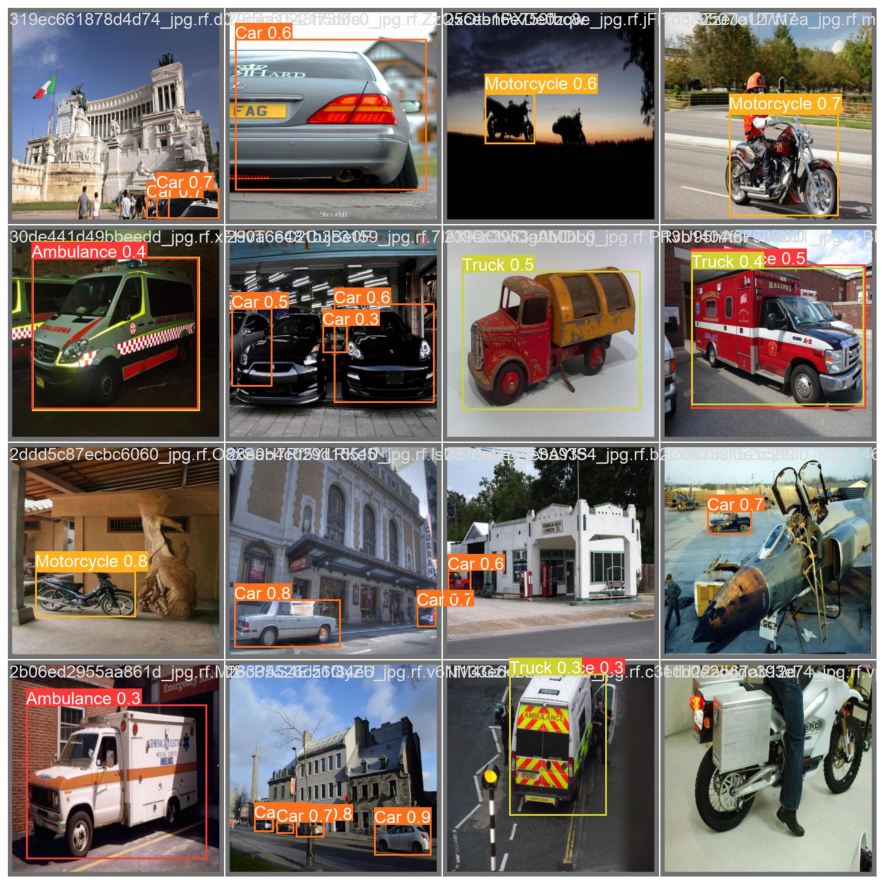

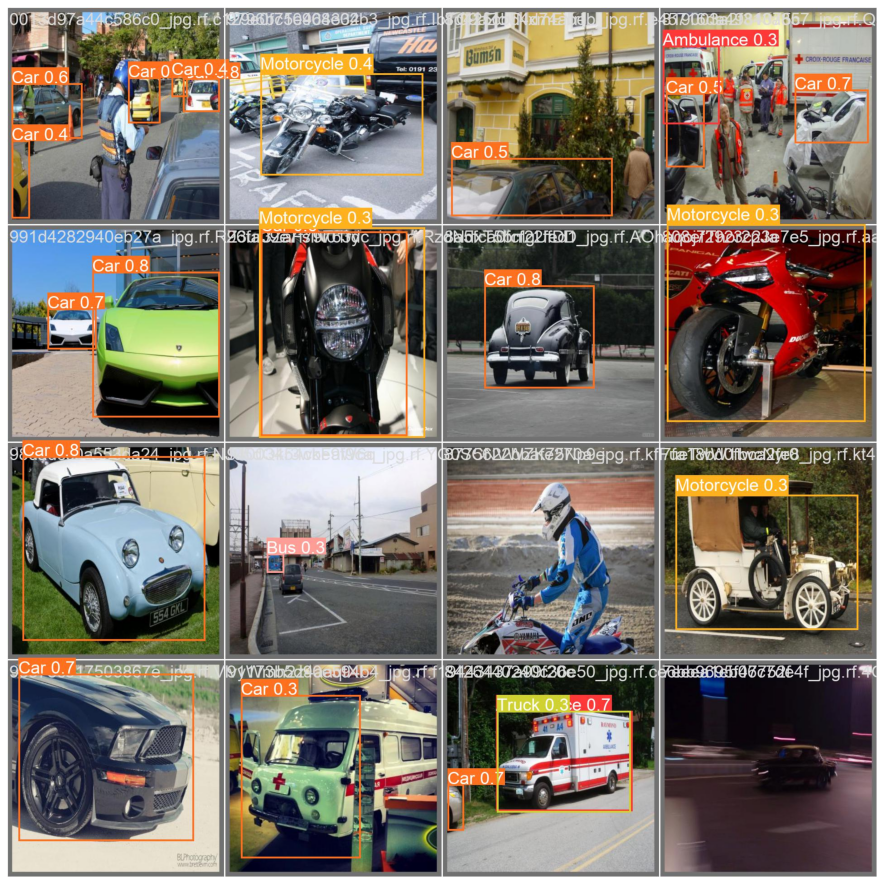

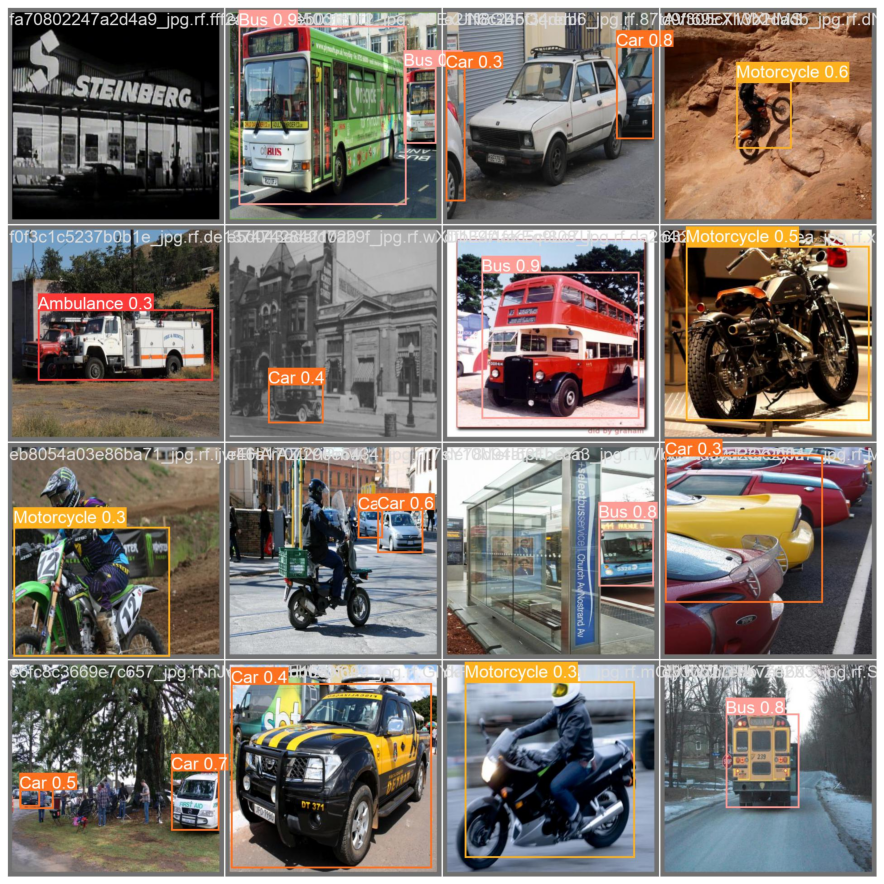

In [ ]:
show_valid_results(RES_DIR)

# **Inference on Image**
##### **To carry out inference on images,we just need to provide the directory path where all the images are sorted,and inference will happen on all the images automatically.**

In [ ]:
#Inference on Images.
IMAGE_INFER_DIR = inference(RES_DIR, '../test/images')

Current number of inference detection directories: 0
inference_1
detect: weights=['runs/train/results_1/weights/best.pt'], source=../test/images, data=data/coco128.yaml, imgsz=[640, 640], conf_thres=0.25, iou_thres=0.45, max_det=1000, device=, view_img=False, save_txt=False, save_conf=False, save_crop=False, nosave=False, classes=None, agnostic_nms=False, augment=False, visualize=False, update=False, project=runs/detect, name=inference_1, exist_ok=False, line_thickness=3, hide_labels=False, hide_conf=False, half=False, dnn=False, vid_stride=1
YOLOv5 🚀 v6.2-123-g5e1a955 Python-3.7.14 torch-1.12.1+cu113 CUDA:0 (Tesla P100-PCIE-16GB, 16281MiB)

Fusing layers... 
Model summary: 157 layers, 7023610 parameters, 0 gradients, 15.8 GFLOPs
image 1/63 /content/test/images/00dea1edf14f09ab_jpg.rf.KJ730oDTFPdXdJxvSLnX.jpg: 640x640 1 Ambulance, 6.2ms
image 2/63 /content/test/images/00e481ea1a520175_jpg.rf.MV6sZ8QCFwFeMYaI2tHm.jpg: 640x640 3 Buss, 6.8ms
image 3/63 /content/test/images/08c8b73e0c2e296